# Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 


---
### Project Overview 

#### Introduction to image recognition
Image recognition is one of the exploding topics in machine learning [1-7]. By building and training state-of-the-art convolutional neural networks, machine learning algorithms can be trained to classify different objects in the images. One of the most famous image recognition project is ImageNet project, which is an ongoing research effort to provide researchers around the world an easily accessible image database. With the great amount of data in the ImageNet database, researchers participated in the ILSVRC (ImageNet Large Scale Visual Recognition Challenge) had built many useful ML algorithms to classify images into one of 1,000 different categories. One great thing for ILSVRC is that several state-of-the-art algorithms and their pre-trained weights can be easily access through Keras deep learning library and can be further used for transfer learning on our image recognition project. 

#### Can we build a ML algorithm to identify the ensembling dog breed for a human image?
Inspired by ImageNet project [8], I will work on the convolutional neural networks project which can be used not only to recognize object in the image but also to learn some interesting features about the recognized image. In this project, I will develop several algorithms that could be used to identify the human, the dog, and also the dog breed.  At the end of this project, your code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  




The image below displays example outputs for my ML dog breed identification App. User will supply one image as input, and my App will identify its ensembling dog breed if human or dog is detected. The output will contain two images: the image on the left will be the original image user supplied with the title showing whether human or dog is detected and the predicted dog breed for this image; the image on the right is an example of dog image having the same dog breed as that of the predicted image. 

Input dog image: in this example, my App predicted a dog in the image and its ensembling dog breed is AUSTRAALIAN_SHEPHERD. An example image of AUSTRAALIAN_SHEPHERD was also showed on the right side for comparison. 
![Sample doggie Output](images/example_doggie_01.png)

Input human image: in this example, my App predicted a human in the image and his/her ensembling dog breed is LOWCHEN. For comparison, an example image of LOWCHEN was also showed on the right side. 
![Sample human Output](images/example_human_01.png)


<a id='TheRoadAhead'></a>
### The Road Ahead

The works in this notebook are breaked into separate parts.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets and perform EDA
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Build and Test the Algorithm


---
<a id='step0'></a>
## Step 0: Import Datasets and perform EDA
([go back to **The Road Ahead**](#TheRoadAhead))


In [2]:
# load necessary modules
import pandas as pd
import numpy as np
import keras
import random
import cv2 
import os
from mtcnn.mtcnn import MTCNN
from glob import glob
from PIL import Image, ImageFile 
from tqdm import tqdm_notebook as tqdm
from keras.preprocessing import image
from keras.applications import VGG16, InceptionResNetV2, NASNetMobile, InceptionV3, ResNet50, VGG19
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras.models import Sequential, model_from_json
from keras.layers import Dropout, Flatten, Conv2D, MaxPooling2D, Activation, Dense, Input
from keras.optimizers import RMSprop, Adam, SGD
from keras.preprocessing.image import ImageDataGenerator
from keras.layers.normalization import BatchNormalization
from keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from sklearn.metrics import accuracy_score, f1_score
import matplotlib.pyplot as plt                        
%matplotlib inline  



The datasets and inputs used in this project contains [dog images](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/dogImages.zip) and [human images](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/lfw.zip). 
1.	Dog images were provided by Udacity, 8351 dog images in total. There are 133 dog breed classes in the dataset, and the samples in each class ranges from 26 to 77. This is not a fully balanced data. Also, the image sizes are varied between images; therefore, resize is needed for the input of the CNN model. 
2.	Human images, 13233 images in total, were downloaded from [Labeled Faces in the Wild Project](http://vis-www.cs.umass.edu/lfw/#download) by the Computer Vision Laboratory established in the Computer Science Department at the University of Massachusetts. There are 13233 human images in total. 


In [3]:
# load filenames for human and dog images
human_files = np.array(glob("./data/lfw/*/*"))
dog_files = np.array(glob("./data/dogImages/*/*/*"))

# print number of images in each dataset
print('There are %d total human images.' % len(human_files))
print('There are %d total dog images.' % len(dog_files))

There are 13233 total human images.
There are 8352 total dog images.


<a id='step1'></a>
## Step 1: Detect Humans
([go back to **The Road Ahead**](#TheRoadAhead))

Firstly, I will build a ML algorithm to detect human in the image. 3 different algorithms, including OpenCV and MTCNN, will be used and compared to find a most accurate to detect human face in the image. <br>
1. [Haar feature-based cascade classifiers](https://docs.opencv.org/trunk/db/d28/tutorial_cascade_classifier.html) to detect human faces in images. OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades). 
2. [Lbp cascade classifiers](https://docs.opencv.org/3.4.3/dc/d88/tutorial_traincascade.html) to detect human faces in images. ([github](https://github.com/opencv/opencv/tree/master/data/lbpcascades))
3. MTCNN (Multi-task Cascaded Convolutional Neural Networks), which is essentially several convolutional networks put together that give out several pieces of information. ([github](https://github.com/ipazc/mtcnn))<br>

Here I show how to use this detector to find human faces in sample images.

In [5]:
# load OpenCV pre-trained face detector
haar_alt_face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')
lbp_face_cascade = cv2.CascadeClassifier('lbpcascades/lbpcascade_frontalface_improved.xml') 
# load MTCNN pre-trained face detector
detector = MTCNN()

In [5]:
# define a helper function that input the image and chosen algorithm
# and output the image with bounding box for each detected face and face coordinates
def face_detector_on_image_tensor(img, face_detector = haar_alt_face_cascade):
    # convert BGR image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # find faces in image
    if face_detector == 'MTCNN':
        # detect faces in the image
        faces = detector.detect_faces(img)
        faces = [x['box'] for x in faces]
        title = 'MTCNN'
    else:
        faces = face_detector.detectMultiScale(gray)
        title = namestr(face_detector, globals())[0]
    # get bounding box for each detected face
    for (x,y,w,h) in faces:
        # add bounding box to color image
        cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    # convert BGR image to RGB for plotting
    cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return cv_rgb, faces, title

# define a helper function that display the image along with bounding box for each face
def face_detector_on_image(img, face_detector = haar_alt_face_cascade):
    #
    cv_rgb, faces, title = face_detector_on_image_tensor(img, face_detector)
    # display the image, along with bounding box
    plt.imshow(cv_rgb)
    plt.title(title + '\nNumber of faces detected: {}'.format(len(faces)))
    plt.show()

# define a helper function to convert function name into a string
def namestr(obj, namespace):
    return [str(name) for name in namespace if namespace[name] is obj]
    

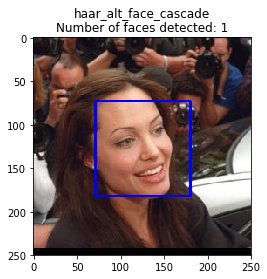

In [6]:
# display a sample image using haar_alt_face_cascade

# load color (BGR) image
img = cv2.imread(human_files[666])
# Find a human face use face detector in a image
face_detector_on_image(img, haar_alt_face_cascade)

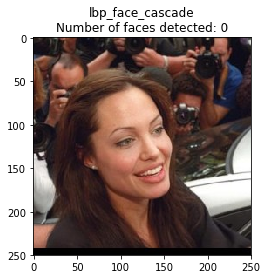

In [7]:
# display a sample image using lbp_face_cascade

#load color (BGR) image
img = cv2.imread(human_files[666])
# Find a human face use face detector in a image
face_detector_on_image(img, lbp_face_cascade)

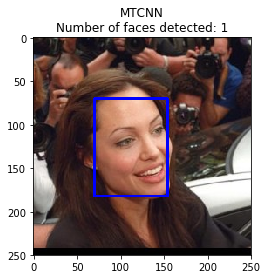

In [8]:
# display a sample image using MTCNN

#load color (BGR) image
img = cv2.imread(human_files[666])
# Find a human face use face detector in a image
face_detector_on_image(img, 'MTCNN')

It's interesting to see that lbp cascade algorithm does not detect a face on this sample human image while both haar cascade and MTCNN successfully detect one face in the image with different bounding box size. To understand the performance of these 3 face detection algorithms, the next step is to evaluate how good they are on detecting faces in the dataset. 

### Human Face Detector and its performance

In order to measure the performance for different face detector algorithms, I use a small subset of training data to see if algorithms can correctly detect faces in human images and not detect faces in dog images. Here, I use 3 metrics to evaluate the performance: accuracy on detecting faces in human images, accuracy on not detecting faces in dog images, and F1 score for classify human and dog images. I first get the first 100 images in both human and dog images for this test. 


In [9]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path, face_cascade):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if face_cascade == 'MTCNN':
        # detect faces in the image
        faces = detector.detect_faces(img)
    else:
        faces = locals()['face_cascade'].detectMultiScale(gray)
    return len(faces) > 0

def human_detector_performance(face_cascade = haar_alt_face_cascade):
    
    human_results = []
    dog_results = []
    for i in tqdm(range(len(human_files_short))):
        human_results.append(face_detector(human_files_short[i], face_cascade))
        dog_results.append(face_detector(dog_files_short[i], face_cascade))

    y_true = np.concatenate((np.ones(len(human_results)), np.zeros(len(dog_results))), axis=None)
    y_pred = np.array(human_results + dog_results)
    
    if face_cascade == 'MTCNN':
        title = 'MTCNN'
    else:
        title = namestr(face_cascade, globals())[0]
    
    print('Human Face Detection Performance ({}):'.format(title))
    print('{:.1f}% of human images have a detected face'.format(np.array(human_results).sum() / len(human_results)*100))
    print('{:.1f}% of dog images have a detected face'.format(np.array(dog_results).sum() / len(dog_results)*100))
    print('F1_score = {:.3f}'.format(f1_score(y_true, y_pred)))
    
    return human_results, dog_results

In [10]:
# Quick test using first 100 images of human and dogs:
human_files_short = human_files[:100]
dog_files_short = dog_files[:100]

In [11]:
## Test the performance of the face_detector algorithm haar_alt_face_cascade
## on the first 100 images of human and dog.
human_results, dog_results = human_detector_performance(haar_alt_face_cascade)


Human Face Detection Performance (haar_alt_face_cascade):
96.0% of human images have a detected face
16.0% of dog images have a detected face
F1_score = 0.906


The test showes quite decent result within few seconds. With harr cascade face detector, it can successfully detect faces in 96 human images, and incorrectly detect faces in 16 dog images. Overall, it has F1 socre = 0.906 for the human and dog classification. To obtain more accurate statistics, let's randonly selected 1000 images of human and dogs in the dataset. 

In [12]:
# To obtain more accurate statistics, 1000 images of human and dogs are further tested:
human_files_short = np.random.choice(human_files, 1000, replace=False)
dog_files_short = np.random.choice(dog_files, 1000, replace=False)

In [13]:
## Test the performance of the face_detector algorithm haar_alt_face_cascade
## on 1000 random images of human and dog.
human_results, dog_results = human_detector_performance(haar_alt_face_cascade)


Human Face Detection Performance (haar_alt_face_cascade):
98.2% of human images have a detected face
10.7% of dog images have a detected face
F1_score = 0.940


In [14]:
## Test the performance of the face_detector algorithm lbp_face_cascade
## on 1000 random images of human and dog.
human_results, dog_results = human_detector_performance(lbp_face_cascade)


Human Face Detection Performance (lbp_face_cascade):
83.4% of human images have a detected face
3.0% of dog images have a detected face
F1_score = 0.895


In [15]:
## Test the performance of the face_detector algorithm MTCNN
## on 1000 random images of human and dog.
human_results, dog_results = human_detector_performance('MTCNN')


Human Face Detection Performance (MTCNN):
97.9% of human images have a detected face
13.9% of dog images have a detected face
F1_score = 0.924


From F1 score, it showes that the performance of haar cascade face detector is the best follows by MTCNN and then lbp cascade algorithm. Overall, these face detectors have done quite decent jobs but could the performance be further improved?? Here, I try to ensemble the classification result from 3 different algorithms by voting. There is a incremental improvement on F1 score by make prediction three times and take the majority clss as the final output. 

In [16]:
human_results = np.zeros((human_files_short.shape[0],2))
dog_results = np.zeros((human_files_short.shape[0],2))

for face_cascade in [haar_alt_face_cascade, lbp_face_cascade, 'MTCNN']:
    for i in tqdm(range(len(human_files_short))):
        if face_detector(human_files_short[i], face_cascade):
            human_results[i] += [0, 1]
        else:
            human_results[i] += [1, 0]
        if face_detector(dog_files_short[i], face_cascade):
            dog_results[i] += [0, 1]
        else:
            dog_results[i] += [1, 0]    

y_true = np.concatenate((np.ones(len(human_results)), np.zeros(len(dog_results))), axis=None)
y_pred = np.concatenate((np.argmax(human_results, axis=1) , np.argmax(dog_results, axis=1)), axis=None)

print('Human Face Detection Performance ({}):'.format('Ensembling'))
print('{:.1f}% of human images have a detected face'.format(np.argmax(human_results, axis=1).sum() / len(human_results)*100))
print('{:.1f}% of dog images have a detected face'.format(np.argmax(dog_results, axis=1).sum() / len(dog_results)*100))
print('F1_score = {:.3f}'.format(f1_score(y_true, y_pred)))


Human Face Detection Performance (Ensembling):
98.0% of human images have a detected face
4.7% of dog images have a detected face
F1_score = 0.967


 Metrics  |haar_alt_face_cascade|lbp_face_cascade|MTCNN | Ensembling
-|-|-|-|-
Detect face in human images|97.8%|82.7%|97.3%|97.0%
Detect face in dog images|9.8%|3.0%|14.9%|3.5%
F1_score|0.942|0.891|0.917|0.968


At the end of this face detector section, here I show you the result from 3 face detection algorithms from 5 random human images. Different algorhtms performs different on different images, some perform better and some perform worse. By ensembling the result, the performan of the face detection can be improved. 

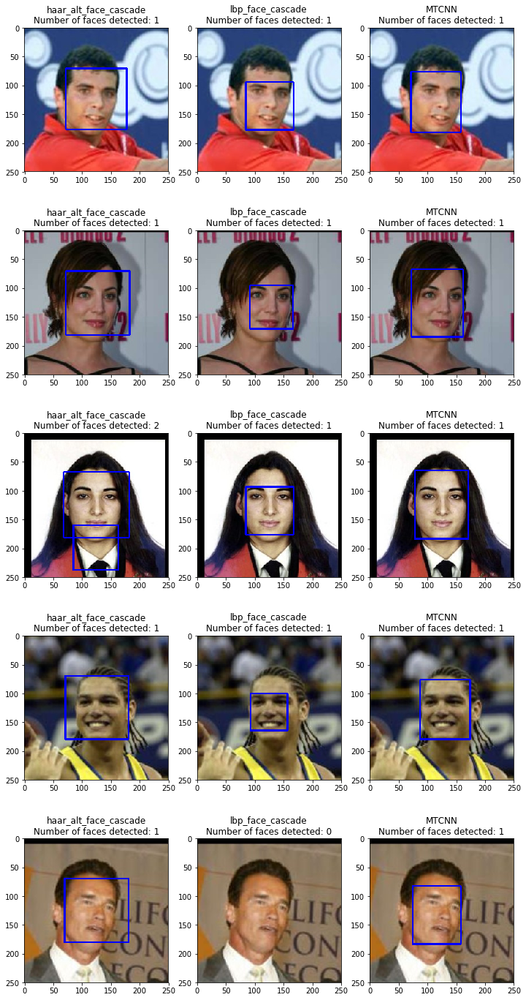

In [18]:
# display a batch of training images

num_image = 5

fig = plt.figure()
fig.set_figheight(4*num_image)
fig.set_figwidth(12)
fig.subplots_adjust(bottom=-0.01*num_image)
for i in range(num_image):

    randint = np.random.randint(1000)
    
    # display the image, along with bounding box
    plt.subplot(num_image, 3, i*3+1)
    img = cv2.imread(human_files[randint])
    img_tensor, faces, title = face_detector_on_image_tensor(img, haar_alt_face_cascade)
    plt.imshow(img_tensor)
    plt.title(namestr(haar_alt_face_cascade, globals())[0] + '\nNumber of faces detected: {}'.format(len(faces)))
    
    plt.subplot(num_image, 3, i*3+2)
    img = cv2.imread(human_files[randint])
    img_tensor, faces, title = face_detector_on_image_tensor(img, lbp_face_cascade)
    plt.imshow(img_tensor)
    plt.title(namestr(lbp_face_cascade, globals())[0] + '\nNumber of faces detected: {}'.format(len(faces)))
    
    plt.subplot(num_image, 3, i*3+3)
    img = cv2.imread(human_files[randint])
    img_tensor, faces, title = face_detector_on_image_tensor(img, 'MTCNN')
    plt.imshow(img_tensor)
    plt.title('MTCNN'+ '\nNumber of faces detected: {}'.format(len(faces)))

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  You will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ <br>
Using the pre-tained face detector "haarcascade_frontalface_alt.xml": <br>
In the first 100 human images, 96.0% of human images have a detected face. <br>
In the first 100 dog images, 16.0% of dog images have a detected face. <br>

To obtain more accurate statistics, 1000 images of human and dogs are further tested using the same face detector: <br>
In the first 1000 human images, 98.3% of human images have a detected face. <br>
In the first 1000 dog images, 9.6% of dog images have a detected face. <br>
From the result tested on 1000 images of human and dogs, the pre-trained face detector gives us quite decent result. 

---
<a id='step2'></a>
## Step 2: Detect Dogs
([go back to **The Road Ahead**](#TheRoadAhead))

In this section, I will use pre-trained models to detect dogs in images.  

### Pre-trained VGG-16 Model

The VGG-16 model along with weights that have been trained on [ImageNet](http://www.image-net.org/) can be loaded from Keras deep learning library.  ImageNet contains over 10 million images, each image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a). Given an image, this pre-trained VGG-16 model returns a prediction (derived from the 1000 possible categories in ImageNet) for the object that is contained in the image.

In [19]:
# define VGG16 model
VGG16_base = VGG16(weights='imagenet',
                  include_top=True,
                  input_shape=(224, 224, 3))

VGG16_base.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

### Dog detector with a pre-trained VGG16 model

The pre-tained VGG16 model is loaded. Next step is to preprocess the image in order to feed into model to make prediction. Since images may vary in size, the first step when loading a image is to resize the image to a target size, 224x224 in this case. To use the pre-trained weighted of VGG16 model, the input image has to go through the same preprocess step used for VGG16 model training dataset. Here, I use the function preprocess_input from Keras, basically subtract the mean value of each RGB channel from the its original value. For other pre-trained models, they could normalize the value range within 0-1, which is also included in my helper function. 

In [20]:
# define a helper function to load a image from file and convert 
# it to tensor with necessary preprocess applied
def image_to_tensor(img_path, vgg16=True):
    img = image.load_img(img_path, target_size=(224, 224))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    if vgg16:
        # apply the same preprocess of VGG16 on image 
        img_tensor = preprocess_input(img_tensor)
    else:
        # normalize value range in tensor within 0-1
        img_tensor /= 255.
    return img_tensor

# define a helper function to display a image for a given image path
def image_to_show(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)    
    img_tensor /= 255.
    plt.imshow(img_tensor[0])
    plt.show()        

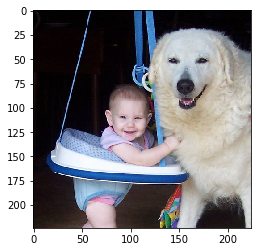

In [21]:
# check the image_to_show helper function
img_path = dog_files_short[3]
image_to_show(img_path) 

Looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you can find that the categories corresponding to dogs appear in dictionary keys 151 (Chihuahua) - 268 (Mexican hairless), and also dict. key 273 (Canis dingo).  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained VGG-16 model, we need only check if the pre-trained model predicts an index between 151 and 268, or an index 273.


In [22]:
# given a image path, this funcion will predict one class from 1000 categories 
# using the specified model
def imagenet_predict(img_path, model = VGG16_base, vgg16 = True):
    img_tensor = image_to_tensor(img_path, vgg16 = vgg16)
    pred = model.predict(img_tensor)
    return np.argmax(pred)

### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path, model = VGG16_base, vgg16 = True):
    pred = imagenet_predict(img_path, model=model, vgg16=vgg16)
    # categories corresponding to dogs are dictionary key 151-268 
    # dictionary key 273 is Canis dingo, which is also a dog
    return ((pred >= 151) and (pred <= 268)) or (pred == 273)  # true/false

### (IMPLEMENTATION) Assess the Dog Detector

__Question 2:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ Using VGG16 pre-trained model, I get
1.0% of human images with a detected face, and 
100.0% of dog images with a detected face

### Dog detector perfoamance

Similar to previous section of human detector performance, here I also check the dog detector performance on the same 1000 random images of human and dog. The same metrics of accuracy and F1 score are used to evalute how good the model is on detect a dog in the images. 

In [23]:
def dog_detector_performance(model = VGG16_base, vgg16 = True, model_name = 'VGG16'):
    
    human_results = []
    dog_results = []
    for i in tqdm(range(len(human_files_short))):
        human_results.append(dog_detector(human_files_short[i], model, vgg16))
        dog_results.append(dog_detector(dog_files_short[i], model, vgg16))

    y_true = np.concatenate((np.zeros(len(human_results)), np.ones(len(dog_results))), axis=None)
    y_pred = np.array(human_results + dog_results)
        
    print('Dog Detection Performance ({}):'.format(model_name))
    print('{:.1f}% of human images have been detected as a dog'.format(np.array(human_results).sum() / len(human_results)*100))
    print('{:.1f}% of dog images have been detected as a dog'.format(np.array(dog_results).sum() / len(dog_results)*100))
    print('F1_score = {:.3f}'.format(f1_score(y_true, y_pred)))
    
    return human_results, dog_results

In [24]:
## Test the performance of the dog_detector algorithm VGG16
## on 1000 random images of human and dog.
human_results, dog_results = dog_detector_performance(model=VGG16_base, vgg16=True, model_name='VGG16')


Dog Detection Performance (VGG16):
0.6% of human images have been detected as a dog
99.0% of dog images have been detected as a dog
F1_score = 0.992


The result shows F1 socre = 0.995 for dog classification in human and dog image. This tells us the pre-trained VGG16 model is doing excellent job for dog classification. Let's take a look which human images are mis-classified as dogs and which dog images are not classified as dogs by pre-trained VGG16 dog detector. For the dog images which not classified as dogs, many white dogs are classified as white wolf. This predicted result is quite reasonable to me since myself cannot clearly distinguish between these two. 

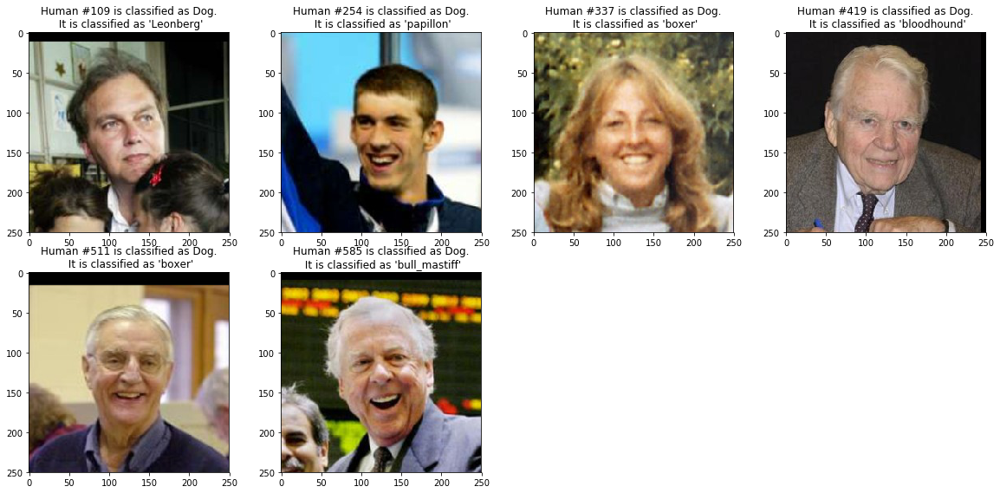

In [25]:
# Check human image that is classified as a dog by dog_detector (pre-trained VGG16):
num_misclassify = np.sum(np.array(human_results)==True)

fig = plt.figure()
fig.set_figheight(5*num_misclassify/4)
fig.set_figwidth(5*4)
fig.subplots_adjust(bottom=-0.01*num_misclassify)

j = 0
for i, item in enumerate(human_results):
    if item == True:
        j+=1
        img = Image.open(human_files_short[i])
        pred = decode_predictions(VGG16_base.predict(image_to_tensor(dog_files_short[i])))[0][0][1]
        plt.subplot(int(np.ceil(num_misclassify/4)), 4, j)
        plt.imshow(img)
        plt.title(f"Human #{i} is classified as Dog.\n It is classified as '{pred}'")


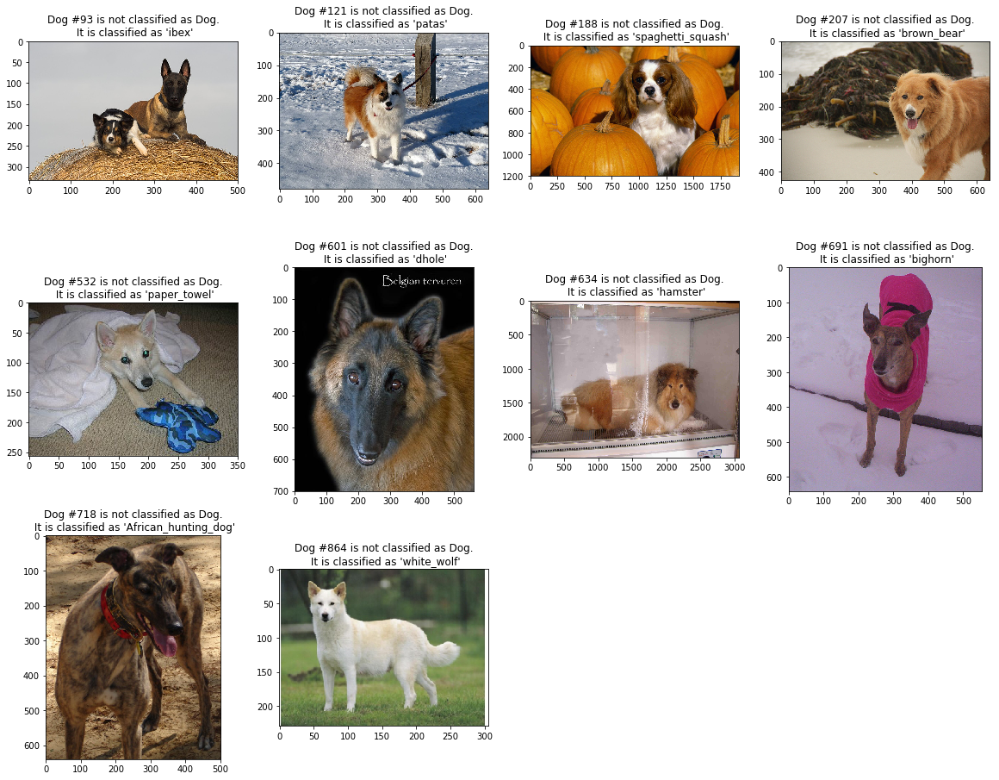

In [26]:
# Check dog image that is not classified as a dog by dog_detector (pre-trained VGG16):
num_misclassify = np.sum(np.array(dog_results)==False)

fig = plt.figure()
fig.set_figheight(5*num_misclassify/4)
fig.set_figwidth(5*4)
fig.subplots_adjust(bottom=-0.01*num_misclassify)

j = 0
for i, item in enumerate(dog_results):
    if item == False:
        j+=1
        img = Image.open(dog_files_short[i])
        pred = decode_predictions(VGG16_base.predict(image_to_tensor(dog_files_short[i])))[0][0][1]
        plt.subplot(int(np.ceil(num_misclassify/4)), 4, j)
        plt.imshow(img)
        plt.title(f"Dog #{i} is not classified as Dog.\n It is classified as '{pred}'")


### More dog detectors with a pre-trained InceptionV3 and NASNetMobile model

Two other pre-trained models, InceptionV3 and NASNetMobile, are used to see their performance on the task of dog detection. One thing to pay attention to is that the preprocess applied on the training images of these two model is different to that of VGG16 model. 

In [27]:
# this could also be the output a different Keras model or layer
input_tensor = Input(shape=(224, 224, 3))  # this assumes K.image_data_format() == 'channels_last'
InceptionV3_base = InceptionV3(input_tensor=input_tensor, weights='imagenet', include_top=True)

### Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.

human_results, dog_results = dog_detector_performance(model=InceptionV3_base, vgg16=False, model_name='InceptionV3')


Dog Detection Performance (InceptionV3):
2.2% of human images have been detected as a dog
99.4% of dog images have been detected as a dog
F1_score = 0.986


In [28]:
# this could also be the output a different Keras model or layer
NASNetMobile_base = NASNetMobile(input_tensor=input_tensor, weights='imagenet', include_top=True)

### Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.

human_results, dog_results = dog_detector_performance(model=NASNetMobile_base, vgg16=False, model_name='NASNetMobile')


Dog Detection Performance (NASNetMobile):
0.7% of human images have been detected as a dog
99.6% of dog images have been detected as a dog
F1_score = 0.995


The performance for InceptionV3 and NASNetMobile model are also pretty good for the dog detection task. By using the same ensemble method, there is still an incremental improvement on the F1 score, though it may not be worth running the prediction three times in this case.  

In [29]:
human_results = np.zeros((human_files_short.shape[0],2))
dog_results = np.zeros((human_files_short.shape[0],2))

for face_cascade, vgg16 in [(VGG16_base, True), (InceptionV3_base, False), (NASNetMobile_base, False)]:
    for i in tqdm(range(len(human_files_short))):
        if dog_detector(human_files_short[i], face_cascade, vgg16):
            human_results[i] += [0, 1]
        else:
            human_results[i] += [1, 0]
        if dog_detector(dog_files_short[i], face_cascade, vgg16):
            dog_results[i] += [0, 1]
        else:
            dog_results[i] += [1, 0]    

y_true = np.concatenate((np.zeros(len(human_results)), np.ones(len(dog_results))), axis=None)
y_pred = np.concatenate((np.argmax(human_results, axis=1) , np.argmax(dog_results, axis=1)), axis=None)

print('Dog Detection Performance ({}):'.format('Ensembling'))
print('{:.1f}% of human images have a detected face'.format(np.argmax(human_results, axis=1).sum() / len(human_results)*100))
print('{:.1f}% of dog images have a detected face'.format(np.argmax(dog_results, axis=1).sum() / len(dog_results)*100))
print('F1_score = {:.3f}'.format(f1_score(y_true, y_pred)))


Dog Detection Performance (Ensembling):
0.4% of human images have a detected face
99.8% of dog images have a detected face
F1_score = 0.997


 Metrics  |VGG16|InceptionV3|NASNetMobile | Ensembling
-|-|-|-|-
Detect dog in human images|0.3%|1.6%|1.0%|0.2%
Detect dog in dog images|99.4%|99.8%|99.7%|99.7%
F1_score|0.995|0.991|0.994|0.997


---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)
([go back to **The Road Ahead**](#TheRoadAhead))

Now the functions for detecting humans and dogs in images are ready with very accuracy, next step is to get a algorithm to predict dog breed from images.  In this step, I will build a simple CNN model to classify dog breeds from scratch as the baseline benchmark model. From here, I can know if this problem is solvable and how can I further improve the performance from benchmark model. 

The task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have trouble distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  A good vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | - | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

Also, random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  



### Data augmentation for training data

With 8000+ dog images, it could be difficult to train the CNN model from scratch. We can get some help by image augmentation to generate more images for training by rotation, shift, zoom, and horizontal flip. This can be easily achieved by using ImageDataGenerator function in Keras deep learning library. The preprocess step applied to the image is normalization (rescale values to 0-1). 

In [30]:
base_dir = './data/dogImages/'

train_dir = os.path.join(base_dir, 'train')
valid_dir = os.path.join(base_dir, 'valid')
test_dir = os.path.join(base_dir, 'test')
ttt_dir = os.path.join(base_dir, 'ttt')

In [34]:

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=15,
      width_shift_range=0.15,
      height_shift_range=0.15,
      shear_range=0,
      zoom_range=0.15,
      horizontal_flip=True,
      fill_mode='nearest')

# Note that the validation and test data should not be augmented!
valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)


train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 224x224
        target_size=(224, 224),
        batch_size=16,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='categorical')

valid_generator = valid_datagen.flow_from_directory(
        valid_dir,
        target_size=(224, 224),
        batch_size=16,
        class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(224, 224),
        batch_size=1,
        class_mode=None,
        shuffle=False)

Found 6680 images belonging to 133 classes.
Found 835 images belonging to 133 classes.
Found 836 images belonging to 133 classes.


There are 133 dog breed class in the dog images. Two types of dictionaries are created for future use; one dict. map dog breed name to the index number, and the other map index number to dog breed name. 

In [35]:
# prepare for the dictionaries which will be used later
my_dict2 = dict((y+1, x.split('.')[1]) for x,y in train_generator.class_indices.items())
my_dict3 = dict((x.split('.')[1], y+1) for x,y in train_generator.class_indices.items())
#pd.DataFrame.from_dict(my_dict2, orient='index', columns=['index']).head()
pd.DataFrame.from_dict(my_dict3, orient='index', columns=['index']).head()

,index
Affenpinscher,1
Afghan_hound,2
Airedale_terrier,3
Akita,4
Alaskan_malamute,5


### The sample distribution for 133 dog breed

To understand the data, here I plot the histogram of 133 dog breed for training, validation and test dataset. The dataset in each group is somehow balanced. 

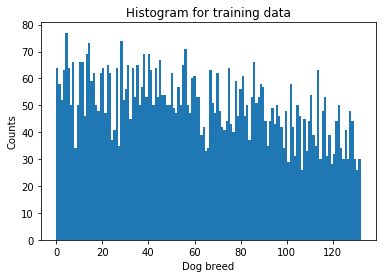

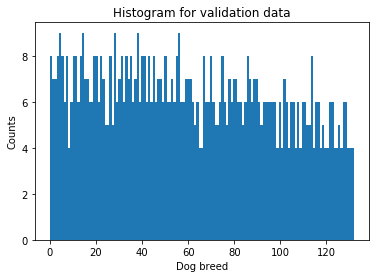

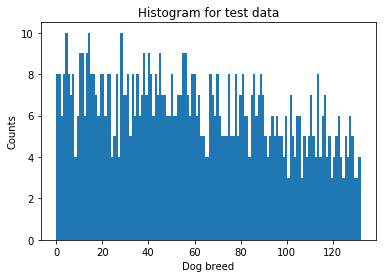

In [36]:
# Histogram for training data
x = train_generator.classes
plt.hist(x, bins=133)
plt.xlabel('Dog breed')
plt.ylabel('Counts')
plt.title('Histogram for training data')
plt.show()

# Histogram for validation data
x = valid_generator.classes
plt.hist(x, bins=133)
plt.xlabel('Dog breed')
plt.ylabel('Counts')
plt.title('Histogram for validation data')
plt.show()

# Histogram for test data
x = test_generator.classes
plt.hist(x, bins=133)
plt.xlabel('Dog breed')
plt.ylabel('Counts')
plt.title('Histogram for test data')
plt.show()

Here let's further examine the training image after augmentation (rotation, shift, zoom, horizontal flip). Overall, the images after augmentation are still looked reasonable. 

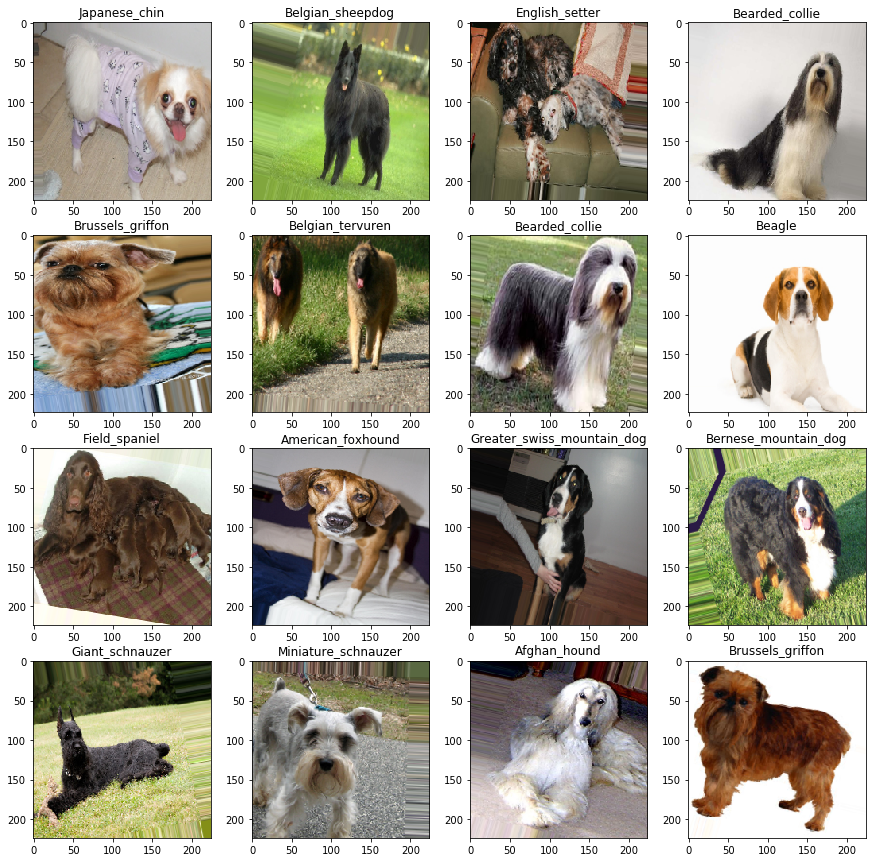

In [37]:
# display a batch of training images
inputs, classes = next(train_generator)

fig = plt.figure()
fig.set_figheight(15)
fig.set_figwidth(15)
for i, (img_tensor, label) in enumerate(zip(inputs, classes)):

    plt.subplot(4, 4, i+1)
    plt.imshow(np.clip(img_tensor,0,1))
    #plt.imshow(img_tensor)
    plt.title(my_dict2[np.argmax(label)+1])

**Question 3:** Describe your chosen procedure for preprocessing the data. 
- How does your code resize the images (by cropping, stretching, etc)?  What size did you pick for the input tensor, and why?
- Did you decide to augment the dataset?  If so, how (through translations, flips, rotations, etc)?  If not, why not?


**Answer**:

### Simple CNN Architecture

A simple CNN model is created to classify dog breed. Basically, I repeat Conv2D and MaxPool layers 5 times to greatly reduce the output shape and then flatten layers followed by dense layers. 

In [39]:
# BUILD CONVOLUTIONAL NEURAL NETWORKS
model = Sequential()
model.add(Conv2D(8, kernel_size = 3, padding='valid', strides=1, activation='tanh', input_shape = (224, 224, 3)))
model.add(MaxPooling2D(2))
model.add(Conv2D(16, kernel_size = 3, padding='valid', strides=1, activation='tanh'))
model.add(MaxPooling2D(2))
model.add(Conv2D(32, kernel_size = 3, padding='valid', strides=1, activation='tanh'))
model.add(MaxPooling2D(2))
model.add(Conv2D(64, kernel_size = 3, padding='valid', strides=1, activation='tanh'))
model.add(MaxPooling2D(2))
model.add(Conv2D(128, kernel_size = 3, padding='valid', strides=1, activation='tanh'))
model.add(MaxPooling2D(2))
model.add(Flatten())
model.add(Dense(256, activation='tanh'))
model.add(Dropout(0.25))
model.add(Dense(133, activation='softmax'))

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_100 (Conv2D)          (None, 222, 222, 8)       224       
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 111, 111, 8)       0         
_________________________________________________________________
conv2d_101 (Conv2D)          (None, 109, 109, 16)      1168      
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 54, 54, 16)        0         
_________________________________________________________________
conv2d_102 (Conv2D)          (None, 52, 52, 32)        4640      
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 26, 26, 32)        0         
_________________________________________________________________
conv2d_103 (Conv2D)          (None, 24, 24, 64)        18496     
__________

To train the model efficiently, learning rate reduction is used to reduce the learning rate during the training, and early stopper is used to stop the train if there is no further improvement on the accuracy. Since I have ~6600 training images and batch size is 16, the steps per epoch is set to 400 so that roughly all the training images are used once per epoch. 

In [40]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0)

earlystopper = EarlyStopping(patience=5, verbose=1)

In [41]:
sgd = SGD(lr=0.05)
model.compile(loss='categorical_crossentropy',
              optimizer=sgd,
              metrics=["accuracy"])

In [182]:
history = model.fit_generator(
      train_generator,
      steps_per_epoch=400,
      epochs=30,
      validation_data=valid_generator,
      validation_steps=50,
      verbose=2,
      callbacks=[learning_rate_reduction, earlystopper])

Epoch 1/30
 - 118s - loss: 4.8360 - acc: 0.0177 - val_loss: 4.6055 - val_acc: 0.0437
Epoch 2/30
 - 114s - loss: 4.6079 - acc: 0.0358 - val_loss: 4.3395 - val_acc: 0.0673
Epoch 3/30
 - 116s - loss: 4.4416 - acc: 0.0502 - val_loss: 4.2603 - val_acc: 0.0584
Epoch 4/30
 - 115s - loss: 4.3239 - acc: 0.0575 - val_loss: 4.1465 - val_acc: 0.0699
Epoch 5/30
 - 116s - loss: 4.2265 - acc: 0.0727 - val_loss: 4.0748 - val_acc: 0.0902
Epoch 6/30
 - 115s - loss: 4.1491 - acc: 0.0828 - val_loss: 4.0144 - val_acc: 0.0991
Epoch 7/30
 - 116s - loss: 4.1087 - acc: 0.0881 - val_loss: 3.9052 - val_acc: 0.0902
Epoch 8/30
 - 115s - loss: 4.0212 - acc: 0.0981 - val_loss: 4.0887 - val_acc: 0.0801

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.02500000037252903.
Epoch 9/30
 - 114s - loss: 3.8219 - acc: 0.1222 - val_loss: 3.7882 - val_acc: 0.1245
Epoch 10/30
 - 115s - loss: 3.7803 - acc: 0.1322 - val_loss: 3.7652 - val_acc: 0.1283
Epoch 11/30
 - 116s - loss: 3.7136 - acc: 0.1395 - val_loss: 3.6005 - 

In [ ]:
# Save model to a HDF5 file
model.save('model_dog_breed_scratch.h5')

In [42]:
# Restore model
model.load_weights('model_dog_breed_scratch.h5')

In [43]:
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(224, 224),
        batch_size=1,
        class_mode=None,
        shuffle=False)

# 
pred= model.predict_generator(test_generator, 836)
predicted_class_indices=np.argmax(pred,axis=1)

print('The accuracy of dog identification is {:.1f}%'.format(accuracy_score(test_generator.classes, predicted_class_indices)*100))

Found 836 images belonging to 133 classes.
The accuracy of dog identification is 23.2%


With ~6600 training images, I can build a dog breed classifier with ~23% accuracy after training for ~1 hour. With a more complex CNN model and more data, the classification accuracy can definitely be improved. Another way for improvement is to use transfer learning, which will be discussed in the next section. 

__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  
__Answer:__ 

---
<a id='step4'></a>
## Step 4: Create a CNN to Classify Dog Breeds (using Transfer Learning)
([go back to **The Road Ahead**](#TheRoadAhead))

Here I will use transfer learning to create a CNN model that can identify dog breed from images. I will use pre-trained VGG16 model followed by few dense layers to predict 133 dog breed classes. I will need to do the same preprocess in order to use pre-trained VGG16 model. Here I define data generator for VGG16, which uses different preprocessing from previous data generator. 

In [51]:
def myFunc(image):
    return preprocess_input(image)

train_datagen_vgg16 = ImageDataGenerator(
      rotation_range=15,
      width_shift_range=0.15,
      height_shift_range=0.15,
      shear_range=0,
      zoom_range=0.15,
      horizontal_flip=True,
      fill_mode='nearest', 
      preprocessing_function=myFunc)

# Note that the validation data should not be augmented!

valid_datagen_vgg16 = ImageDataGenerator(preprocessing_function=myFunc)
test_datagen_vgg16 = ImageDataGenerator(preprocessing_function=myFunc)

train_generator_vgg16 = train_datagen_vgg16.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(224, 224),
        batch_size=16,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='categorical')

valid_generator_vgg16 = valid_datagen_vgg16.flow_from_directory(
        valid_dir,
        target_size=(224, 224),
        batch_size=16,
        class_mode='categorical')


Found 6680 images belonging to 133 classes.
Found 835 images belonging to 133 classes.


Let's load the whole VGG16 model with the pre-trained weights with input shape 224x224x3. There are ~138M trainable parameters in the original VGG16 models. The last dense layer also shows that there are 1000 classes for the final prediction. 

In [52]:
# define VGG16 model
VGG16_base2 = VGG16(weights='imagenet',
                  include_top=True,
                  input_shape=(224, 224, 3))
VGG16_base2.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

To build my dog breed classifier, which only has 133 classes, I will need to remove the last dense layer from original VGG16 model. Then I will add few more layers of Dense, BatchNormalization, and Dropout. I also need to freeze the layers from VGG16 model so that their weights will not be changed during my training. In this way, I will only do the training to obtain the weights for the layers I add into the model. 

In [53]:
VGG16_base2.layers.pop()

model = Sequential()
for layer in VGG16_base2.layers:
    model.add(layer)
for layer in model.layers:
    layer.trainable = False
model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))
model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.25))
model.add(Dense(133, activation='sigmoid'))

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
_________________________________________________________________
block3_conv1 (Conv2D)        (None, 56, 56, 256)       295168    
__________

To make the training converge faster and train the model efficiently, learning rate reduction is used to reduce the learning rate during the training, and early stopper is used to stop the train if there is no further improvement on the accuracy. Since I have ~6600 training images and batch size is 16, the steps per epoch is set to 400 so that roughly all the training images are used once per epoch. 

In [54]:
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=2, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0)

earlystopper = EarlyStopping(patience=5, verbose=1)

In [55]:
adam =Adam(lr=0.002)
model.compile(loss='categorical_crossentropy',
              optimizer=adam,
              metrics=["accuracy"])


In [27]:
history = model.fit_generator(
      train_generator_vgg16,
      steps_per_epoch=400,
      epochs=30,
      validation_data=valid_generator_vgg16,
      validation_steps=50,
      verbose=2,
      callbacks=[learning_rate_reduction, earlystopper])

Epoch 1/30
 - 111s - loss: 3.6197 - acc: 0.3031 - val_loss: 1.3214 - val_acc: 0.5832
Epoch 2/30
 - 107s - loss: 1.4280 - acc: 0.5836 - val_loss: 0.8970 - val_acc: 0.7078
Epoch 3/30
 - 107s - loss: 1.1057 - acc: 0.6670 - val_loss: 0.8265 - val_acc: 0.7382
Epoch 4/30
 - 107s - loss: 0.9536 - acc: 0.7030 - val_loss: 0.7221 - val_acc: 0.7662
Epoch 5/30
 - 107s - loss: 0.8720 - acc: 0.7238 - val_loss: 0.7768 - val_acc: 0.7510
Epoch 6/30
 - 108s - loss: 0.8175 - acc: 0.7408 - val_loss: 0.6758 - val_acc: 0.7726
Epoch 7/30
 - 107s - loss: 0.7401 - acc: 0.7594 - val_loss: 0.7490 - val_acc: 0.7560
Epoch 8/30
 - 106s - loss: 0.7155 - acc: 0.7686 - val_loss: 0.7399 - val_acc: 0.7700

Epoch 00008: ReduceLROnPlateau reducing learning rate to 0.0010000000474974513.
Epoch 9/30
 - 108s - loss: 0.6014 - acc: 0.8048 - val_loss: 0.6863 - val_acc: 0.7992
Epoch 10/30
 - 107s - loss: 0.5409 - acc: 0.8230 - val_loss: 0.6681 - val_acc: 0.8043
Epoch 11/30
 - 108s - loss: 0.5031 - acc: 0.8331 - val_loss: 0.6778 

In [43]:
# Creates a HDF5 file 'my_model.h5'
model.save('model_dog_breed_transfer.h5')


In [56]:
# restore the saved model
model.load_weights('model_dog_breed_transfer.h5')

In [57]:
# to see the performace of the trained model on the test data

test_generator_vgg16 = test_datagen_vgg16.flow_from_directory(
        test_dir,
        target_size=(224, 224),
        batch_size=1,
        class_mode=None,
        shuffle=False)

pred= model.predict_generator(test_generator_vgg16, 836)
predicted_class_indices=np.argmax(pred,axis=1)

print('The accuracy of dog identification is {:.1f}%'.format(accuracy_score(test_generator.classes, predicted_class_indices)*100))

Found 836 images belonging to 133 classes.
The accuracy of dog identification is 81.8%


 Metrics  |Training|Validation|Test 
-|-|-|-
Accuracy|90.2%|81.8%|81.8%



### Predict dog breed with the model
Using the transfer learning, I have built a dog breed classifier with more than 80% accuracy after training for less than 1 hour. Let's see few example of dog breed predition using the model I just build for dog and human images. It is quite amazing that the model predict most of dog breed correctly on dog images. 

In [58]:
def predict_breed_transfer(img_path):
    # load the image and return the predicted breed
    img_tensor = image_to_tensor(img_path, vgg16=True)
    #img_tensor = preprocess_input(img_tensor)
    pred = model.predict(img_tensor)
    
    return my_dict2[np.argmax(pred)+1]

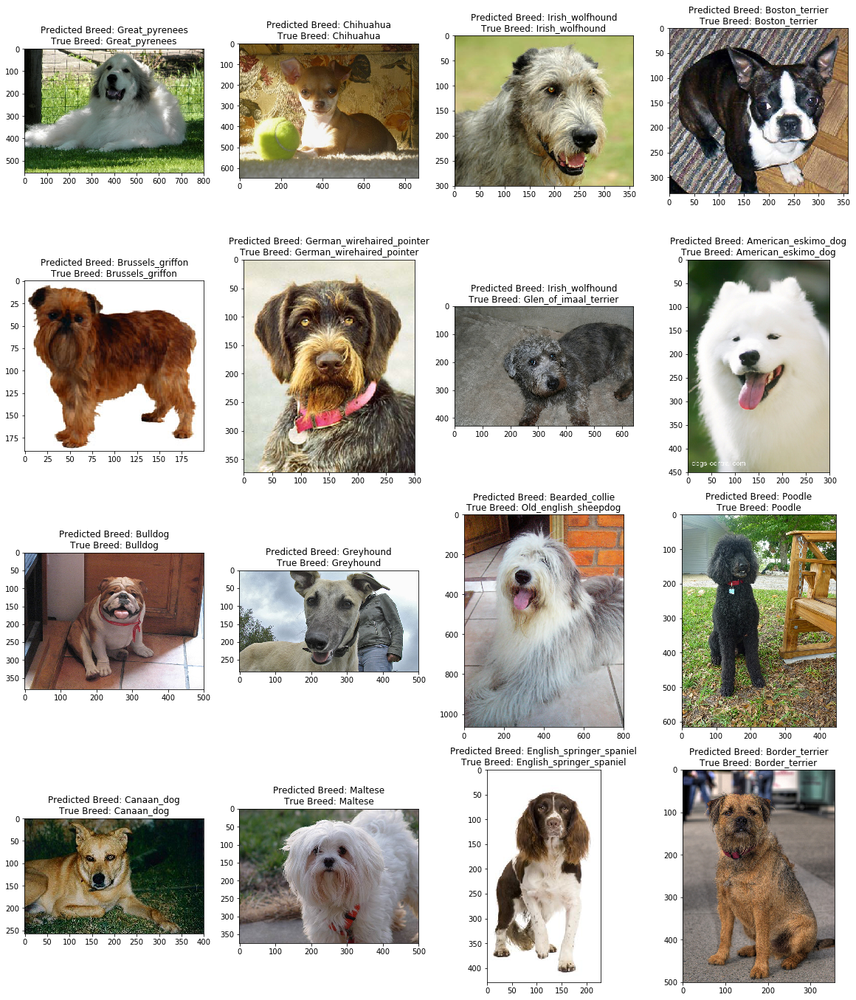

In [59]:
num_img = 16

fig = plt.figure()
fig.set_figheight(5*num_img/4)
fig.set_figwidth(5*4)
fig.subplots_adjust(bottom=-0.01*int(np.ceil(num_img/4)))

j = 0
for i, img_path in enumerate(random.sample(list(dog_files_short), num_img)): 
    plt.subplot(4, 4, i+1)

    true_breed= img_path.split('\\')[2].split('.')[1]
    predicted_breed = predict_breed_transfer(img_path)
    img = Image.open(img_path)
    plt.title(f"Predicted Breed: {predicted_breed}\nTrue Breed: {true_breed}")
    plt.imshow(img)

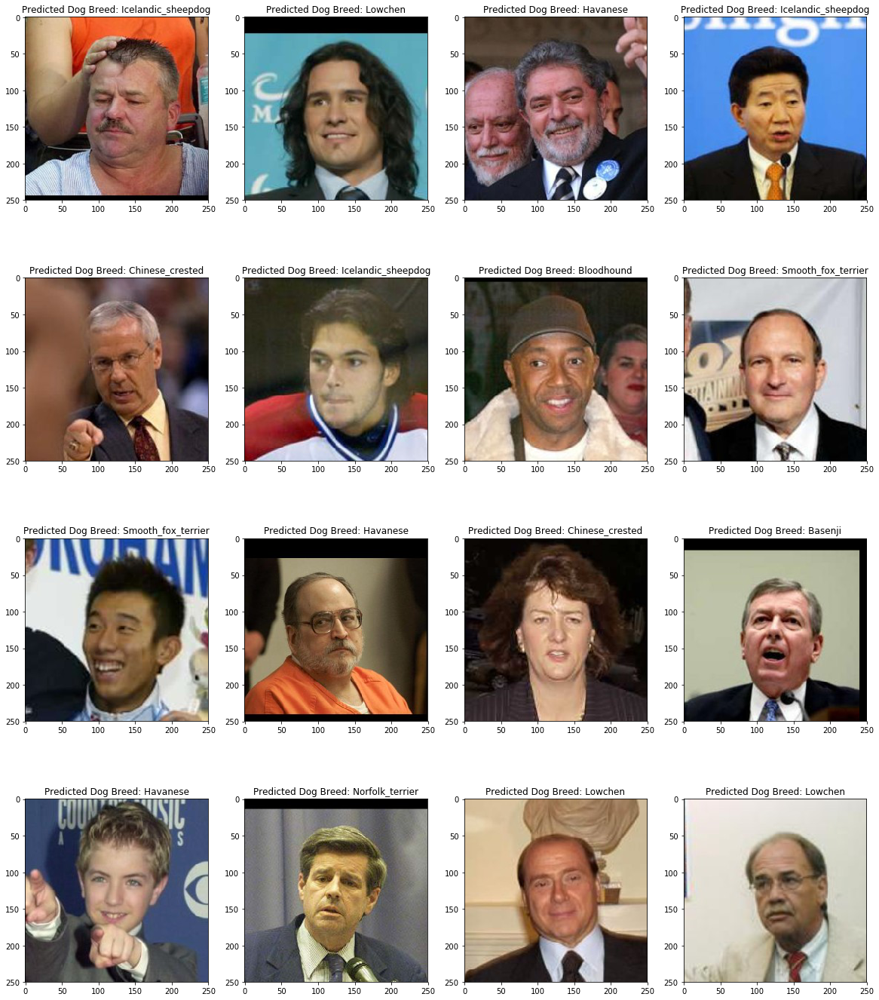

In [60]:
num_img = 16

fig = plt.figure()
fig.set_figheight(5*num_img/4)
fig.set_figwidth(5*4)
fig.subplots_adjust(bottom=-0.01*int(np.ceil(num_img/4)))

j = 0
for i, img_path in enumerate(random.sample(list(human_files_short), num_img)): 
    plt.subplot(4, 4, i+1)

    predicted_breed = predict_breed_transfer(img_path)
    img = Image.open(img_path)
    plt.title(f"Predicted Dog Breed: {predicted_breed}")
    plt.imshow(img)


---
<a id='step5'></a>
## Step 5: Build and Test the Algorithm
([go back to **The Road Ahead**](#TheRoadAhead))

To warp up everything I have built, I write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __human__ is detected in the image, return the resembling dog breed.
- if a __dog__ is detected in the image, return the predicted breed.
- if __neither__ is detected in the image, provide output that indicates an error.

As I showed in human detector and dog detector section, ensemble method by voting from 3 different model can improve the performance. Therefore, instead of make 1 prediction for human detector or dog detector, I will make 3 predictions for each case and use voting to get more accuracy prediction. 

Finally, user will supply one image as input, and my App will identify its ensembling dog breed if human or dog is detected. The output will contain two images: the image on the left will be the original image user supplied with the title showing whether human or dog is detected and the predicted dog breed for this image; the image on the right is an exmple of dog image having the same dog breed as that of the predicted image. 

![Sample doggie Output](images/example_doggie_02.png)

In [61]:
def display_image_twin(img_path, predicted_breed, title=""):
    img_tensor = Image.open(img_path)
    
    fig = plt.figure()
    fig.set_figheight(6)
    fig.set_figwidth(9)
    fig.subplots_adjust(bottom=-0.00)
    
    tmp_dir = str(my_dict3[predicted_breed]).zfill(3) + '.' + predicted_breed
    tmp_files = np.array(glob("./data/dogImages/train/{}/*".format(tmp_dir)))
    tmp_img_tensor = Image.open(np.random.choice(tmp_files, 1, replace=False)[0])
    
    plt.subplot(1, 2, 1)
    plt.imshow(img_tensor)
    plt.title(title)
    
    plt.subplot(1, 2, 2)
    plt.imshow(tmp_img_tensor)
    plt.title('this is an example of ... \n' + predicted_breed.upper())
    plt.show()

In [62]:
# write the algorithm to put everything together

def run_app(img_path):
    ## handle cases for a human face, dog, and neither
    # check if image has juman faces:
    face_detector_ensemble = pd.Series([face_detector(img_path, haar_alt_face_cascade),
                                        face_detector(img_path, lbp_face_cascade),
                                        face_detector(img_path, 'MTCNN')]).value_counts().index[0]
    dog_detector_ensemble = pd.Series([dog_detector(img_path, VGG16_base, True),
                                        dog_detector(img_path, InceptionV3_base, False),
                                        dog_detector(img_path, NASNetMobile_base, False)]).value_counts().index[0]
    if face_detector_ensemble:
        predicted_breed = predict_breed_transfer(img_path)
        title = 'hello human!\nYou look like a ... \n{}'.format(predicted_breed.upper())
        display_image_twin(img_path, predicted_breed, title)
        
    # check if image has dogs:
    elif dog_detector_ensemble:
        predicted_breed = predict_breed_transfer(img_path)
        title = 'hello doggie!\nYour breed is most likley ... \n{}'.format(predicted_breed.upper())
        display_image_twin(img_path, predicted_breed, title)        
    else:
        print("Opps! We couldn't detect any dog or human face in the image.")
        display_image(img_path)
        print("Try another image!")


### Test the algorithm on sample images!

Here I will test my algorithm on several random dog images and human images. By putting one same dog breed image on the right side, you can easily see if the predicted dog breed make sense by just comparing the image you provide on the left to the image on the right. 

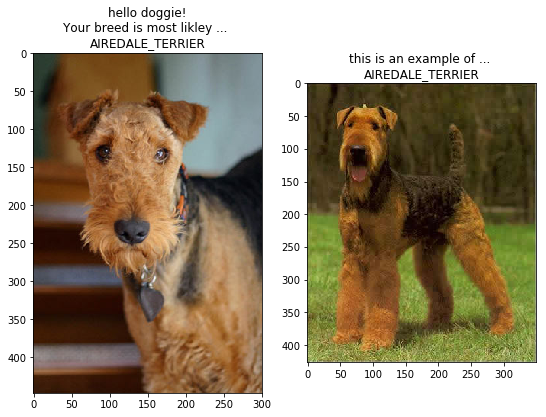

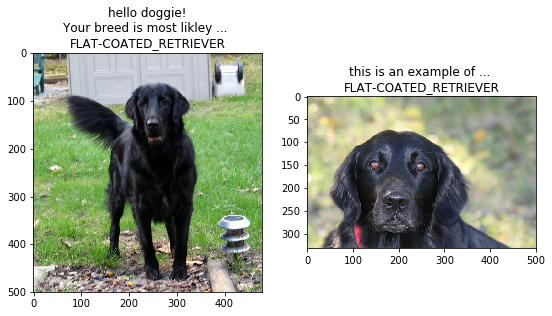

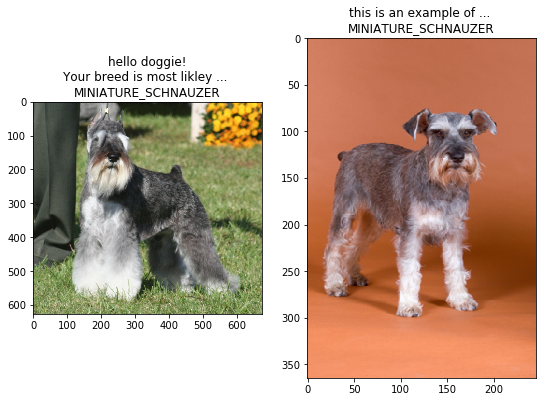

In [63]:
## suggested code, below
for file in np.random.choice(dog_files, 3, replace=False):
    run_app(file)

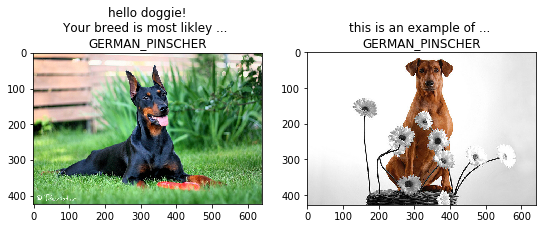

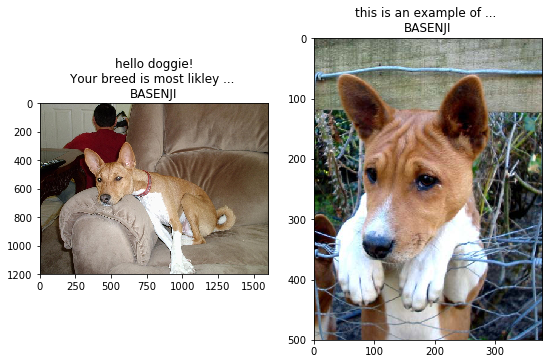

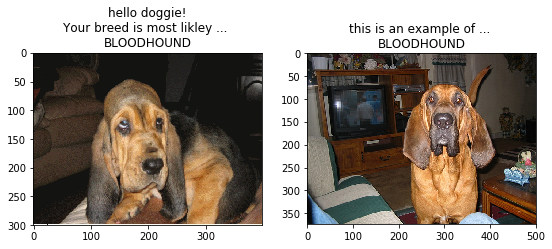

In [64]:
## suggested code, below
for file in np.random.choice(dog_files, 3, replace=False):
    run_app(file)

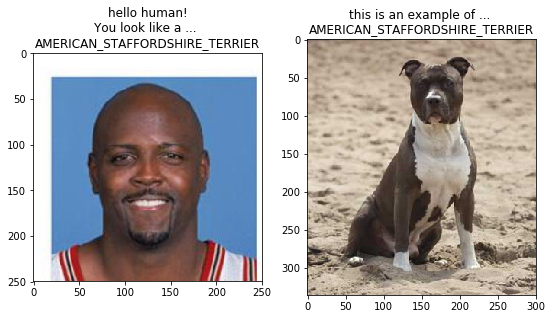

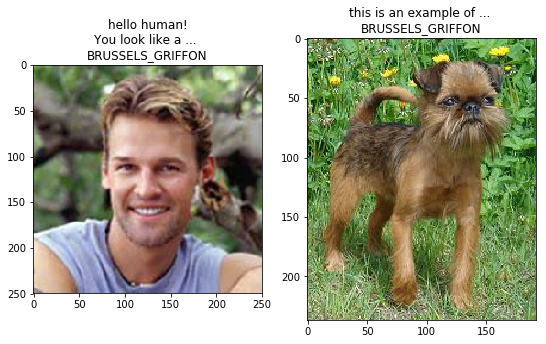

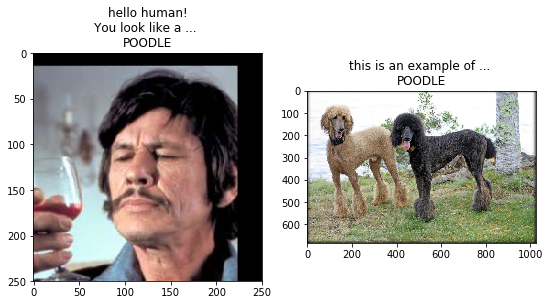

In [66]:
## suggested code, below
for file in np.random.choice(human_files, 3, replace=False):
    run_app(file)

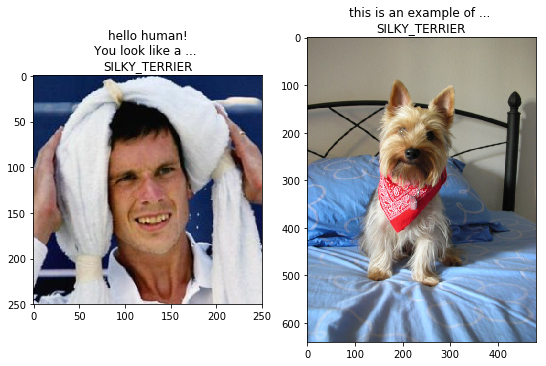

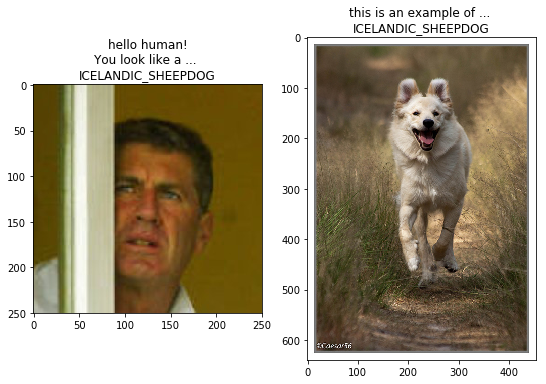

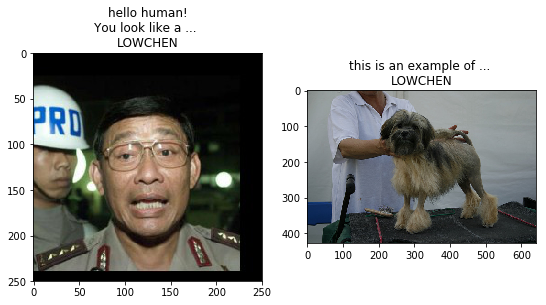

In [67]:
## suggested code, below
for file in np.random.choice(human_files, 3, replace=False):
    run_app(file)

## Reference

1. Olga Russakovsky*, Jia Deng*, Hao Su, Jonathan Krause, Sanjeev Satheesh, Sean Ma, Zhiheng Huang, Andrej Karpathy, Aditya Khosla, Michael Bernstein, Alexander C. Berg and Li Fei-Fei. (* = equal contribution) ImageNet Large Scale Visual Recognition Challenge. International Journal of Computer Vision, 2015. 
2.	J. Deng, O. Russakovsky, J. Krause, M. Bernstein, A. Berg, L. Fei-Fei. Scalable multi-label annotation. ACM conference on human factors in computing (CHI), 2014. 
3.	O. Russakovsky, J. Deng, Z. Huang, A. Berg and L. Fei-Fei, Detecting avocados to zucchinis: what have we done, and where are we going?, Proceedings of the International Conference of Computer Vision (ICCV). 2013 
4.	J. Deng, A. Berg, K. Li and L. Fei-Fei, What does classifying more than 10,000 image categories tell us? Proceedings of the 12th European Conference of Computer Vision (ECCV). 2010.
5.	O. Russakovsky and L. Fei-Fei, Attribute Learning in Large-scale Datasets. Proceedings of the 12th European Conference of Computer Vision (ECCV), 1st International Workshop on Parts and Attributes. 2010. 
6.	J. Deng, W. Dong, R. Socher, L.-J. Li, K. Li and L. Fei-Fei, ImageNet: A Large-Scale Hierarchical Image Database. IEEE Computer Vision and Pattern Recognition (CVPR), 2009. 
7.	J. Deng, K. Li, M. Do, H. Su, L. Fei-Fei, Construction and Analysis of a Large Scale Image Ontology. In Vision Sciences Society (VSS), 2009. 
8.	ImageNet project: ImageNet is an ongoing research effort to provide researchers around the world an easily accessible image database. http://image-net.org/index
